In [16]:
# DATA VISUALITATION to check everzthing is okay
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import os

# List of countries and years
countries = ["Germany", "France", "Belgium", "Poland", "Finland", "Netherlands", "Denmark"]
years = range(2015, 2023)
folder_path = "historical_data"

# Create a dictionary to store the data frames
data_frames = {}

# Read CSV files
for country in countries:
    country_data_frames = []
    
    for year in years:
        file_name = f"energy-charts_Public_net_electricity_generation_in_{country}_in_{year}.csv"
        file_path = os.path.join(folder_path, file_name)
        
        if os.path.isfile(file_path):
            df = pd.read_csv(file_path)
            df = df.dropna(subset=["Date (UTC)"])
            # hourly frequency
            df["Date (UTC)"] = pd.to_datetime(df["Date (UTC)"])
            # df = df[df["Date (UTC)"].dt.strftime("%Y-%m-%dT%H:%M:%S%z").str.endswith("00:00")]
            # df = df[df["Date (UTC)"].dt.strftime("%Y-%m-%dT%H:00+00:00")]
            country_data_frames.append(df)
            # print(f"File: {file_path}, Rows: {len(df)}")
    
    if country_data_frames:
        combined_df = pd.concat(country_data_frames)
        combined_df = combined_df.loc[:, ~combined_df.columns.str.contains('^Unnamed')]
        data_frames[f"df_{country}"] = combined_df
        
# filtering years 2016-2022 for all countries
def filter_2015(df):
    filter_condition = (df['Date (UTC)'].dt.year == 2015) & (df['Date (UTC)'] != '2015-12-31T23:00:00.000Z')
    filtered_df = df[~filter_condition]
    return filtered_df

def add_extra_row(df):
    last_row = df.iloc[-1]  # Get the last row of the DataFrame
    extra_row = last_row.copy()  # Create a copy of the last row
    extra_row['Date (UTC)'] = pd.to_datetime('2022-12-31T22:00:00.000Z')  # Set the datetime value
    df = df.append(extra_row, ignore_index=True)  # Append the extra row to the DataFrame
    return df


BE_df = filter_2015(data_frames["df_Belgium"][2:])
DE_df = filter_2015(data_frames["df_Germany"][4:])
DE_df = DE_df[DE_df['Date (UTC)'].dt.strftime("%M") == "00"]
DK2_df = filter_2015(data_frames["df_Denmark"][2:])
PL_df = filter_2015(data_frames["df_Poland"][2:])
FIN_df= filter_2015(data_frames['df_Finland'][2:])
NL_df= filter_2015(data_frames['df_Netherlands'][2:])
FR_df= filter_2015(data_frames['df_France'][2:])
FIN_df = add_extra_row(FIN_df)
# # DF_VRE_GENERATION_HIST

# Germany
df_DE_wind_onshore = DE_df['Wind onshore'].astype(float)
df_DE_wind_offshore = DE_df['Wind offshore'].astype(float)
df_DE_solar = DE_df['Solar'].astype(float)
df_DE_ResLoad = DE_df['Residual load'].astype(float)
df_DE_Load = DE_df['Load'].astype(float)

# Denmark
df_DK2_wind_onshore = DK2_df['Wind onshore'].astype(float)
df_DK2_wind_offshore = DK2_df['Wind offshore'].astype(float)
df_DK2_solar = DK2_df['Solar'].astype(float)
df_DK2_ResLoad = DK2_df['Residual load'].astype(float)
df_DK2_Load = DK2_df['Load'].astype(float)

# Poland
df_PL_wind_onshore = PL_df['Wind onshore'].astype(float)
# df_PL_wind_offshore = PL_df['Wind offshore']
df_PL_solar = PL_df['Solar'].astype(float)
df_PL_ResLoad = PL_df['Residual load'].astype(float)
df_PL_Load = PL_df['Load'].astype(float)

# Finland
df_FIN_wind_onshore = FIN_df['Wind onshore'].astype(float)
# df_FIN_wind_offshore = FIN_df['Wind offshore']
# df_FIN_solar = FIN_df['Solar']
df_FIN_ResLoad = FIN_df['Residual load'].astype(float)
df_FIN_Load = FIN_df['Load'].astype(float)

# Netherlands
df_NL_wind_onshore = NL_df['Wind onshore'].astype(float)
df_NL_wind_offshore = NL_df['Wind offshore'].astype(float)
df_NL_solar = NL_df['Solar'].astype(float)
df_NL_ResLoad = NL_df['Residual load'].astype(float)
df_NL_Load = NL_df['Load'].astype(float)

# Belgium
df_BE_wind_onshore = BE_df['Wind onshore'].astype(float)
df_BE_wind_offshore = BE_df['Wind offshore'].astype(float)
df_BE_solar = BE_df['Solar'].astype(float)
df_BE_ResLoad = BE_df['Residual load'].astype(float)
df_BE_Load = BE_df['Load'].astype(float)

# France
df_FR_wind_onshore = FR_df['Wind onshore'].astype(float)
# df_FR_wind_offshore = FR_df['Wind offshore']
df_FR_solar = FR_df['Solar'].astype(float)
df_FR_ResLoad = FR_df['Residual load'].astype(float)
df_FR_Load = FR_df['Load'].astype(float)


C:\Users\ngt13\AppData\Local\Temp\ipykernel_2524\4267072694.py:25: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)
C:\Users\ngt13\AppData\Local\Temp\ipykernel_2524\4267072694.py:49: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(extra_row, ignore_index=True)  # Append the extra row to the DataFrame


## COVE CALCULATION:
to calculate the parameter 'p': hourly spot price divided by the time-averaged annual spot price.
Separation of Q= Qavg + Q'(Q_p: variable components of Q: So Q-Qavg), where Q is hourly VRE generation/ time-average demand. 
(will also look whether it is D or RD there)
m: price-demand slope.
D= hourly demand by annnual average demand
the parameter p is then following the following equation:
p= m*D + (1-m) -m*Q_p

We will get the scatter plots to get the m:
1. Demand
    1.1 Residual Demand
2. Spot prices

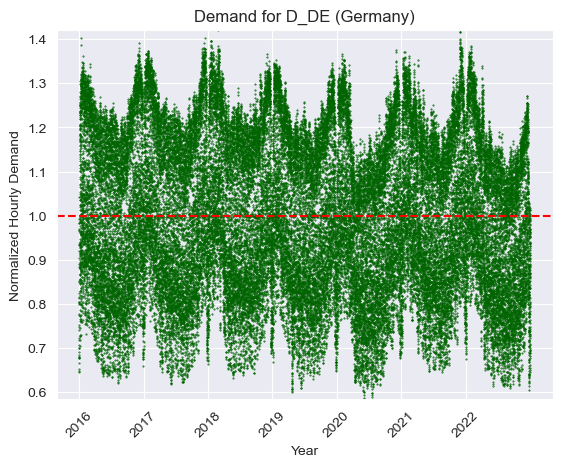

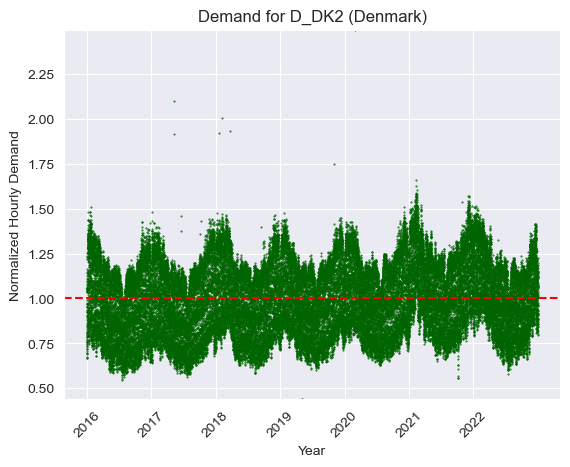

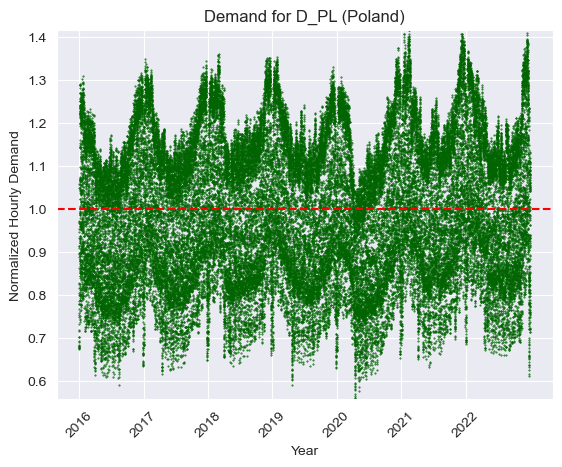

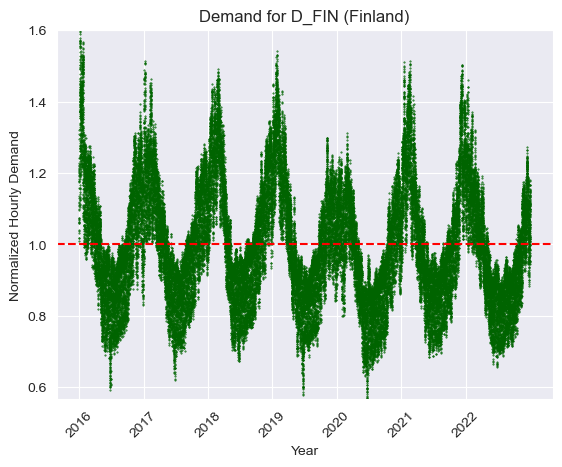

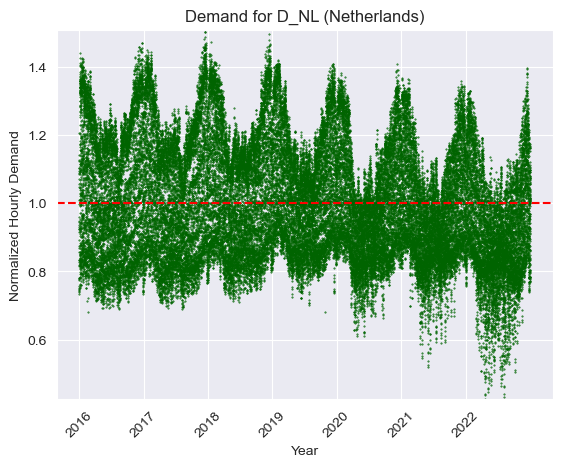

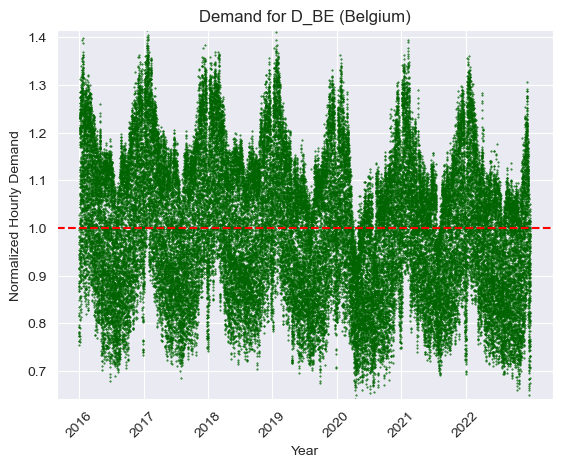

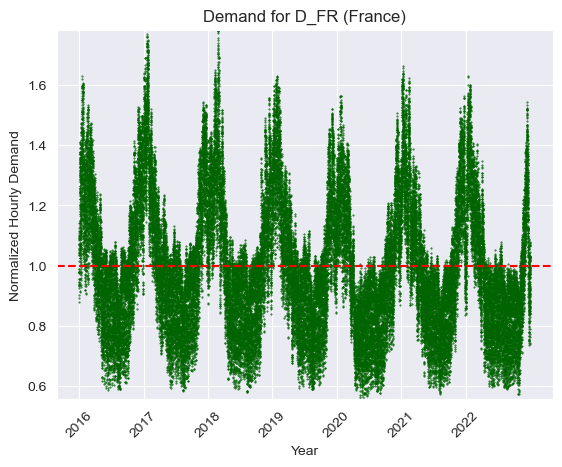

In [107]:
# DEMAND: d
start_year_indexes = [0, 8785, 17545, 26305, 35065, 43849, 52608, 61368]
year_labels = [2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]

def calculate_demand(load_df, start_index, end_index):
    load_data = load_df.astype(float).iloc[start_index:end_index]
    avg_load = load_data.mean()
    demand = load_data / avg_load
    return demand, avg_load


# Plotting Demands: 
def plot_demands(dfL, dfL_name, avg_load, start_indexes, year_labels):
    x = range(len(dfL))
    y = dfL.values.flatten()
    if len(y) == 0:
        print(f"No data available for {dfL_name}")
        return
    avg_load=dfL.mean()
    plt.scatter(x, y, marker='o', s=0.2, color='darkgreen')
    plt.axhline(y=avg_load, color='red', linestyle='--')
    plt.xticks(start_indexes, year_labels, rotation=45)
    plt.xlabel('Year')
    plt.ylabel('Normalized Hourly Demand')
    plt.title(f'Demand for {dfL_name}')
    plt.ylim(min(y), max(y))
    plt.show()
# --------------------------------------------------------------------------------------------------------------------------
# select start and end year: choose index
i_st_y=0
i_end_y=7
# --------------------------------------------------------------------------------------------------------------------------
# Germany
df_DE_Load = df_DE_Load.astype(float)
D_DE, avg_D_DE = calculate_demand(df_DE_Load, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_demands(D_DE, 'D_DE (Germany)', avg_D_DE, start_year_indexes[i_st_y:i_end_y], year_labels[i_st_y:i_end_y])

# Denmark
df_DK2_Load = df_DK2_Load.astype(float)
D_DK2, avg_D_DK2 = calculate_demand(df_DK2_Load, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_demands(D_DK2, 'D_DK2 (Denmark)', avg_D_DK2, start_year_indexes[i_st_y:i_end_y], year_labels[i_st_y:i_end_y])

# Poland
df_PL_Load = df_PL_Load.astype(float)
D_PL, avg_D_PL = calculate_demand(df_PL_Load, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_demands(D_PL, 'D_PL (Poland)', avg_D_PL, start_year_indexes[i_st_y:i_end_y], year_labels[i_st_y:i_end_y])

# Finland
df_FIN_Load = df_FIN_Load.astype(float)
D_FIN, avg_D_FIN = calculate_demand(df_FIN_Load, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_demands(D_FIN, 'D_FIN (Finland)', avg_D_FIN, start_year_indexes[i_st_y:i_end_y], year_labels[i_st_y:i_end_y])

# Netherlands
df_NL_Load = df_NL_Load.astype(float)
D_NL, avg_D_NL = calculate_demand(df_NL_Load, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_demands(D_NL, 'D_NL (Netherlands)', avg_D_NL, start_year_indexes[i_st_y:i_end_y], year_labels[i_st_y:i_end_y])

# Belgium
df_BE_Load = df_BE_Load.astype(float)
D_BE, avg_D_BE = calculate_demand(df_BE_Load, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_demands(D_BE, 'D_BE (Belgium)', avg_D_BE, start_year_indexes[i_st_y:i_end_y], year_labels[i_st_y:i_end_y])

# France
df_FR_Load = df_FR_Load.astype(float)
D_FR, avg_D_FR = calculate_demand(df_FR_Load, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_demands(D_FR, 'D_FR (France)', avg_D_FR, start_year_indexes[i_st_y:i_end_y], year_labels[i_st_y:i_end_y])


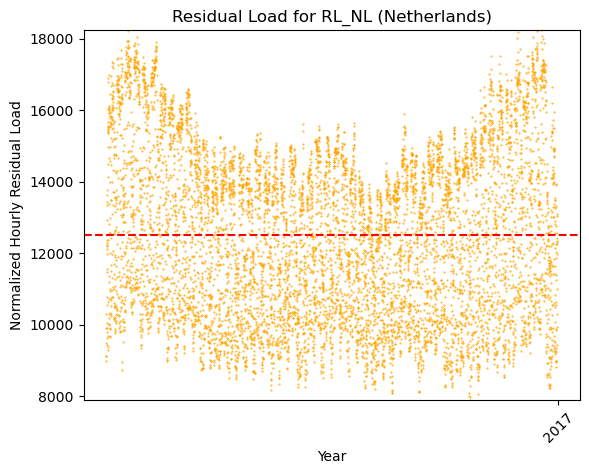

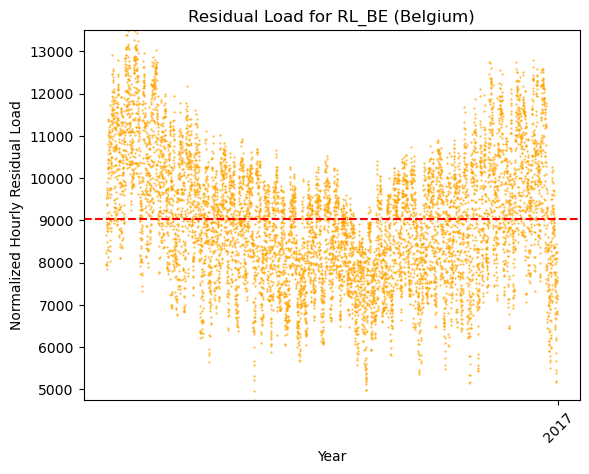

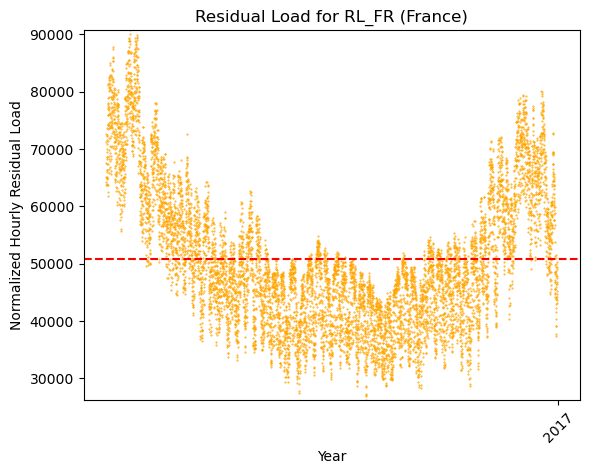

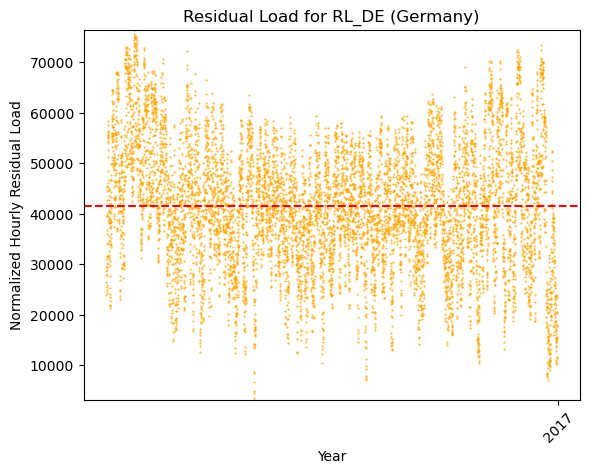

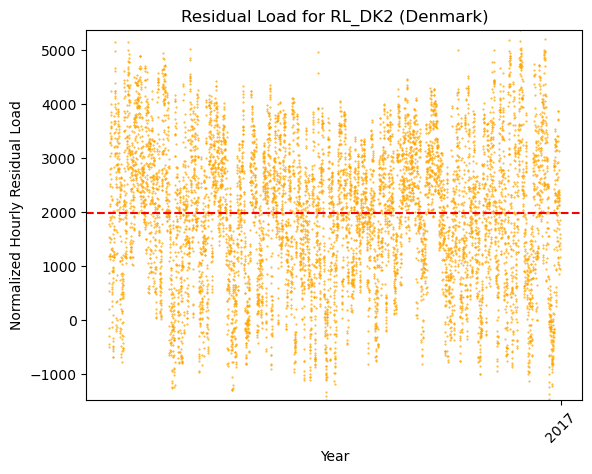

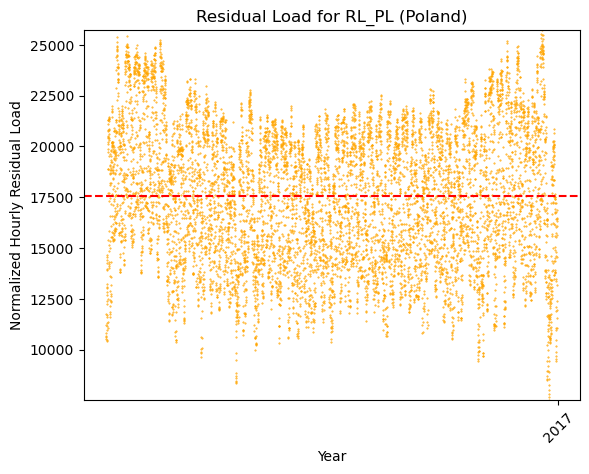

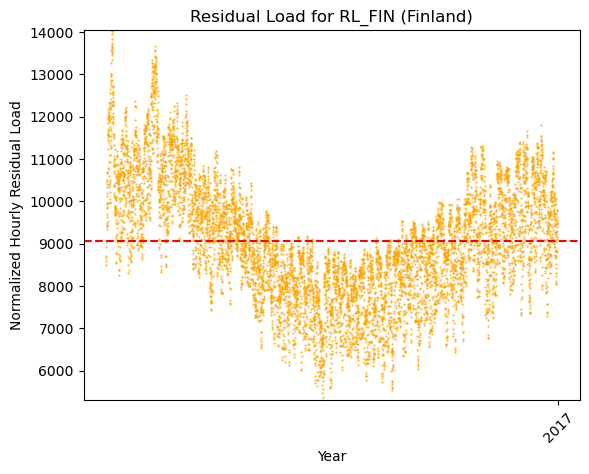

In [4]:
# residual demand
start_year_indexes = [0, 8785, 17545, 26305, 35065, 43849, 52608]
year_labels = [2016, 2017, 2018, 2019, 2020, 2021, 2022]

def calculate_resload(resload_df, start_index, end_index):
    resload_data = resload_df.astype(float).iloc[start_index:end_index]
    avg_resload = resload_data.mean()
    demand = resload_data / avg_resload
    return resload_data, avg_resload


# Plotting Residual Load: 
def plot_resload(dfResL, dfResL_name, avg_resload, start_indexes, year_labels):
    x = range(len(dfResL))
    y = dfResL.values.flatten()
    if len(y) == 0:
        print(f"No data available for {dfResL_name}")
        return
    avg_load=dfResL.mean()
    plt.scatter(x, y, marker='o', s=0.2, color='orange')
    plt.axhline(y=avg_resload, color='red', linestyle='--')
    plt.xticks(start_indexes, year_labels, rotation=45)
    plt.xlabel('Year')
    plt.ylabel('Normalized Hourly Residual Load')
    plt.title(f'Residual Load for {dfResL_name}')
    plt.ylim(min(y), max(y))
    plt.show()
# --------------------------------------------------------------------------------------------------------------------------
# select start and end year: choose index
i_st_y=1
i_end_y=2
# --------------------------------------------------------------------------------------------------------------------------
# Netherlands
df_NL_ResLoad = df_NL_ResLoad.astype(float)
RL_NL, avg_RL_NL = calculate_resload(df_NL_ResLoad, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_resload(RL_NL, 'RL_NL (Netherlands)', avg_RL_NL, start_year_indexes[i_st_y:i_end_y], year_labels[i_st_y:i_end_y])

# Belgium
df_BE_ResLoad = df_BE_ResLoad.astype(float)
RL_BE, avg_RL_BE = calculate_resload(df_BE_ResLoad, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_resload(RL_BE, 'RL_BE (Belgium)', avg_RL_BE, start_year_indexes[i_st_y:i_end_y], year_labels[i_st_y:i_end_y])

# France
df_FR_ResLoad = df_FR_ResLoad.astype(float)
RL_FR, avg_RL_FR = calculate_resload(df_FR_ResLoad, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_resload(RL_FR, 'RL_FR (France)', avg_RL_FR, start_year_indexes[i_st_y:i_end_y], year_labels[i_st_y:i_end_y])

# Germany
df_DE_ResLoad = df_DE_ResLoad.astype(float)
RL_DE, avg_RL_DE = calculate_resload(df_DE_ResLoad, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_resload(RL_DE, 'RL_DE (Germany)', avg_RL_DE, start_year_indexes[i_st_y:i_end_y], year_labels[i_st_y:i_end_y])

# Denmark
df_DK2_ResLoad = df_DK2_ResLoad.astype(float)
RL_DK2, avg_RL_DK2 = calculate_resload(df_DK2_ResLoad, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_resload(RL_DK2, 'RL_DK2 (Denmark)', avg_RL_DK2, start_year_indexes[i_st_y:i_end_y], year_labels[i_st_y:i_end_y])

# Poland
df_PL_ResLoad = df_PL_ResLoad.astype(float)
RL_PL, avg_RL_PL = calculate_resload(df_PL_ResLoad, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_resload(RL_PL, 'RL_PL (Poland)', avg_RL_PL, start_year_indexes[i_st_y:i_end_y], year_labels[i_st_y:i_end_y])

# Finland
df_FIN_ResLoad = df_FIN_ResLoad.astype(float)
RL_FIN, avg_RL_FIN = calculate_resload(df_FIN_ResLoad, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_resload(RL_FIN, 'RL_FIN (Finland)', avg_RL_FIN, start_year_indexes[i_st_y:i_end_y], year_labels[i_st_y:i_end_y])


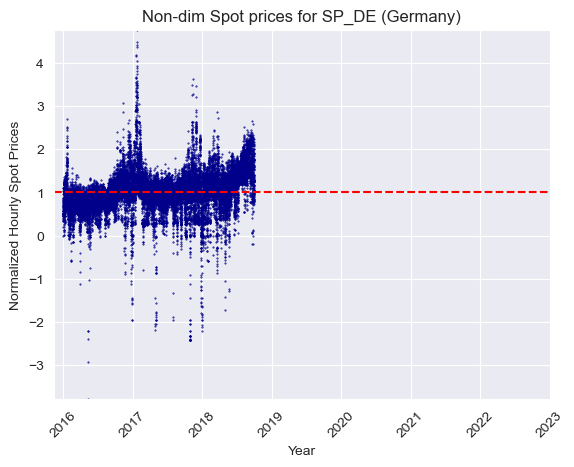

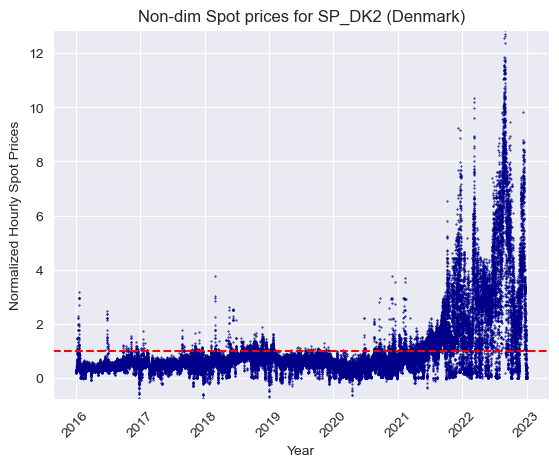

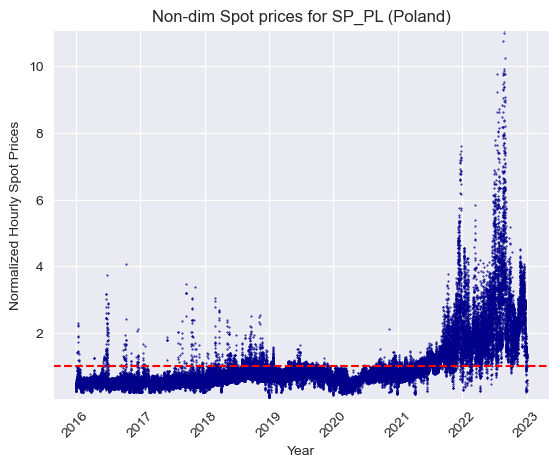

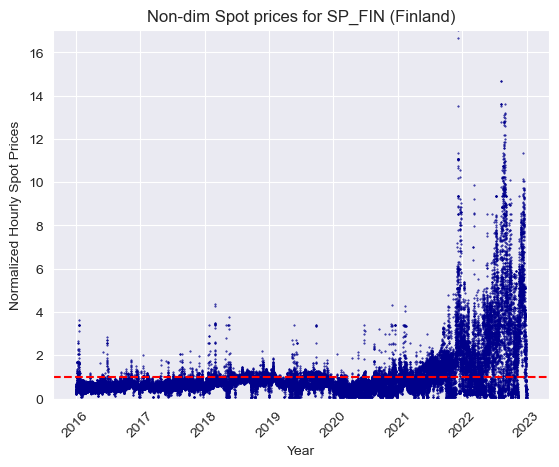

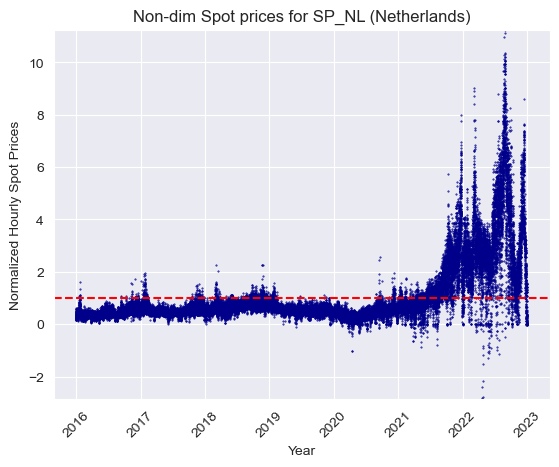

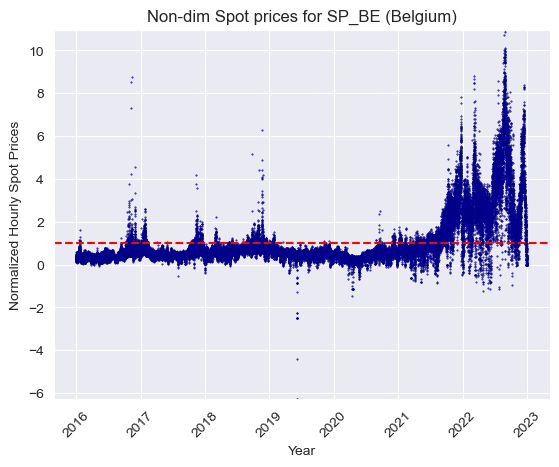

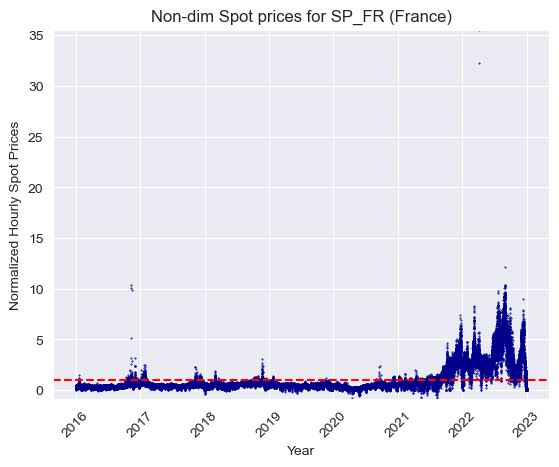

In [114]:
start_year_indexes = [0, 8785, 17545, 26305, 35065, 43849, 52608, 61368]
year_labels = [2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]

# --------------------------------------------------------------------------------------------------------------------------
# select start and end year: choose index
i_st_y=0
i_end_y=7
# --------------------------------------------------------------------------------------------------------------------------

# Data for SP for each country
df_FR_histSP = FR_df['Day Ahead Auction (FR)']
df_FIN_histSP = FIN_df['Day Ahead Auction (FI)']
df_BE_histSP = BE_df['Day Ahead Auction (BE)']
df_NL_histSP = NL_df['Day Ahead Auction (NL)']
df_DE_histSP = DE_df['Day Ahead Auction (DE-AT-LU)']
df_DK2_histSP = DK2_df['Day Ahead Auction (DK2)']
df_PL_histSP = PL_df['Day Ahead Auction (PL)']

def calculate_SP(SP_df, start_index, end_index):
    SP_data = SP_df.astype(float).iloc[start_index:end_index]
    avg_SP = SP_data.mean()
    norm_p = SP_data / avg_SP
    return norm_p, avg_SP

def plot_prices(SP_df, SP_name, avg_load, start_indexes, year_labels):
    x = range(len(SP_df))
    y = SP_df.values.flatten()
    valid_values = np.isfinite(y)  # Filter out NaN and Inf values
    y = y[valid_values]
    x = np.array(x)[valid_values]

    if len(y) == 0:
        print(f"No data available for {SP_name}")
        return

    avg_load = SP_df.mean()
    plt.scatter(x, y, marker='o', s=0.2, color='darkblue')
    plt.axhline(y=avg_load, color='red', linestyle='--')
    plt.xticks(start_indexes, year_labels, rotation=45)
    plt.xlabel('Year')
    plt.ylabel('Normalized Hourly Spot Prices')
    plt.title(f'Non-dim Spot prices for {SP_name}')
    plt.ylim(min(y), max(y))
    plt.show()


# Germany
df_DE_histSP = df_DE_histSP.astype(float)
SP_DE, avg_SP_DE = calculate_SP(df_DE_histSP, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_prices(SP_DE, 'SP_DE (Germany)', avg_SP_DE, start_year_indexes[i_st_y:i_end_y+1], year_labels[i_st_y:i_end_y+1])

# Denmark
df_DK2_histSP = df_DK2_histSP.astype(float)
SP_DK2, avg_SP_DK2 = calculate_SP(df_DK2_histSP, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_prices(SP_DK2, 'SP_DK2 (Denmark)', avg_SP_DK2, start_year_indexes[i_st_y:i_end_y+1], year_labels[i_st_y:i_end_y+1])

# Poland
df_PL_histSP = df_PL_histSP.astype(float)
SP_PL, avg_SP_PL = calculate_SP(df_PL_histSP, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_prices(SP_PL, 'SP_PL (Poland)', avg_SP_PL, start_year_indexes[i_st_y:i_end_y+1], year_labels[i_st_y:i_end_y+1])

# Finland
df_FIN_histSP = df_FIN_histSP.astype(float)
SP_FIN, avg_SP_FIN = calculate_SP(df_FIN_histSP, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_prices(SP_FIN, 'SP_FIN (Finland)', avg_SP_FIN, start_year_indexes[i_st_y:i_end_y+1], year_labels[i_st_y:i_end_y+1])

# Netherlands
df_NL_histSP = df_NL_histSP.astype(float)
SP_NL, avg_SP_NL = calculate_SP(df_NL_histSP, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_prices(SP_NL, 'SP_NL (Netherlands)', avg_SP_NL, start_year_indexes[i_st_y:i_end_y+1], year_labels[i_st_y:i_end_y+1])

# Belgium
df_BE_histSP = df_BE_histSP.astype(float)
SP_BE, avg_SP_BE = calculate_SP(df_BE_histSP, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_prices(SP_BE, 'SP_BE (Belgium)', avg_SP_BE, start_year_indexes[i_st_y:i_end_y+1], year_labels[i_st_y:i_end_y+1])

# France
df_FR_histSP = df_FR_histSP.astype(float)
SP_FR, avg_SP_FR = calculate_SP(df_FR_histSP, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_prices(SP_FR, 'SP_FR (France)', avg_SP_FR, start_year_indexes[i_st_y:i_end_y+1], year_labels[i_st_y:i_end_y+1])

sp_norm = {
    'SP_FR': SP_FR.reset_index(drop=True),
    'SP_BE': SP_BE.reset_index(drop=True),
    'SP_DE': SP_DE.reset_index(drop=True),
    'SP_PL': SP_PL.reset_index(drop=True),
    'SP_FIN': SP_FIN.reset_index(drop=True),
    'SP_NL': SP_NL.reset_index(drop=True),
    'SP_DK2': SP_DK2.reset_index(drop=True)
}

# Create a DataFrame from the sp_norm dictionary
df_spn = pd.DataFrame(sp_norm)

# Save the DataFrame to an Excel file
# df_spn.to_excel('norm_sp_0_6.xlsx', index=False)
df_spn.to_excel('norm_sp_0_7.xlsx', index=False)

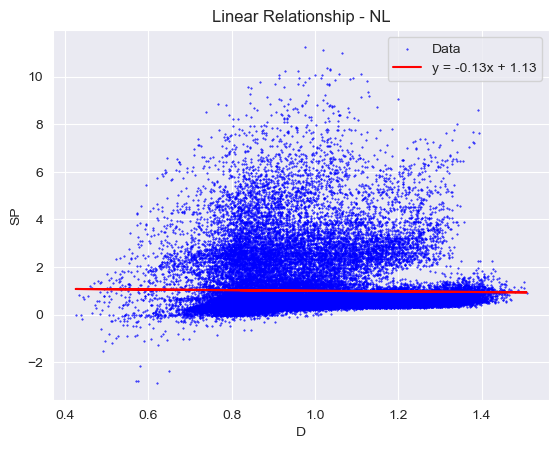

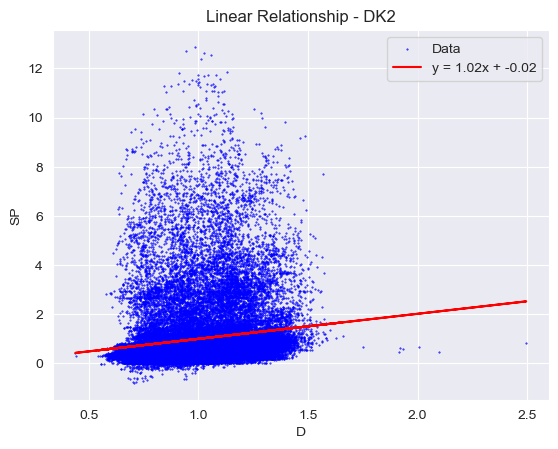

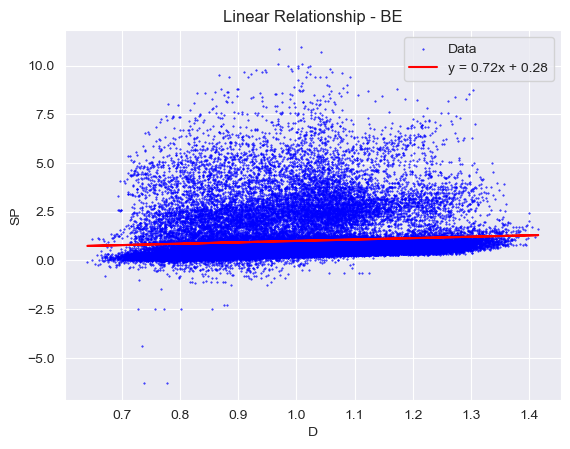

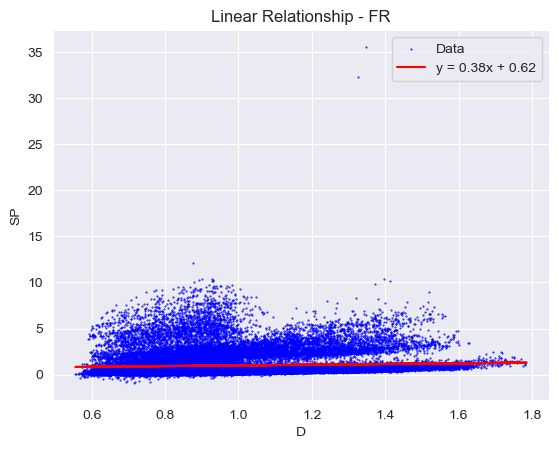

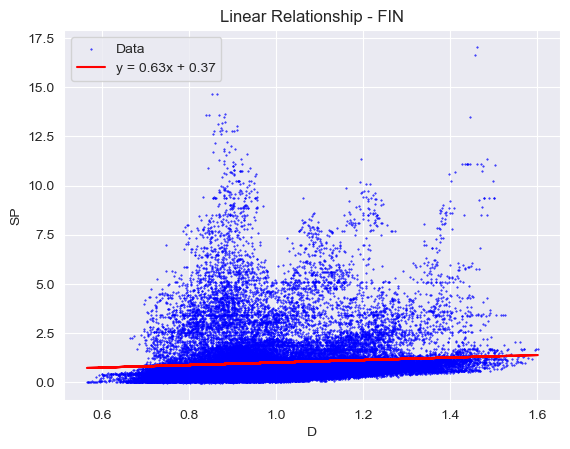

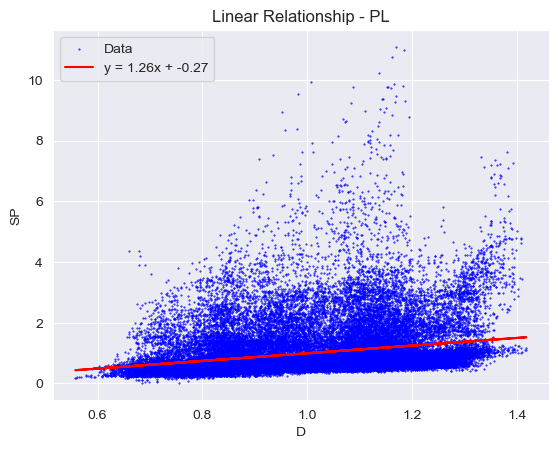

Country: NL
Slope (m): -0.13202920408199145
Intercept (n): 1.1320292040819924
Correlation: -0.01898564013798295

Country: DK2
Slope (m): 1.0195913065073374
Intercept (n): -0.019562593029124782
Correlation: nan

Country: BE
Slope (m): 0.7157323608321006
Intercept (n): 0.2842676391679001
Correlation: 0.08480281627346217

Country: FR
Slope (m): 0.3785791621122994
Intercept (n): 0.6214528679926369
Correlation: nan

Country: FIN
Slope (m): 0.6337980444531573
Intercept (n): 0.36647960961564086
Correlation: nan

Country: PL
Slope (m): 1.2620026766598618
Intercept (n): -0.2675410689769521
Correlation: nan



In [108]:
# --------------------------------------------------------------------------------------------------------------------------
# select start and end year: choose index
i_st_y=0
i_end_y=7
# --------------------------------------------------------------------------------------------------------------------------
data = {
    'NL': (D_NL, SP_NL),
    'DK2': (D_DK2, SP_DK2),
    'BE': (D_BE, SP_BE),
    'FR': (D_FR, SP_FR),
    # 'DE': (D_DE, SP_DE),
    'FIN': (D_FIN, SP_FIN),
    'PL': (D_PL, SP_PL),
}

slopes = {}
intercepts = {}
correlations = {}

for country, (D, SP) in data.items():

    nan_mask = np.isnan(D) | np.isnan(SP)

    D_no_nan = D[~nan_mask]
    SP_no_nan = SP[~nan_mask]

    m, n = np.polyfit(D_no_nan, SP_no_nan, 1)

    correlation = np.corrcoef(D, SP)[0, 1]

    slopes[f"m_{country}_{i_st_y}_{i_end_y}"] = m
    intercepts[f"n_{country}_{i_st_y}_{i_end_y}"] = n
    correlations[f"corr_{country}_{i_st_y}_{i_end_y}"] = correlation

    line = f'y = {m:.2f}x + {n:.2f}'

    plt.scatter(D, SP, color='blue', label='Data', s=0.2)
    plt.plot(D, m * D + n, color='red', label=line)
    plt.xlabel('D')
    # plt.xlabel('D')
    plt.ylabel('SP')
    plt.title(f'Linear Relationship - {country}')
    plt.legend()
    plt.show()

slopes_df = pd.DataFrame.from_dict(slopes, orient='index', columns=['Slope'])
intercepts_df = pd.DataFrame.from_dict(intercepts, orient='index', columns=['Intercept'])
correlations_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['Correlation'])

# Print the slopes, intercepts, and correlations for all countries
for country in data:
    print(f'Country: {country}')
    print('Slope (m):', slopes[f"m_{country}_{i_st_y}_{i_end_y}"])
    print('Intercept (n):', intercepts[f"n_{country}_{i_st_y}_{i_end_y}"])
    print('Correlation:', correlations[f"corr_{country}_{i_st_y}_{i_end_y}"])
    print()

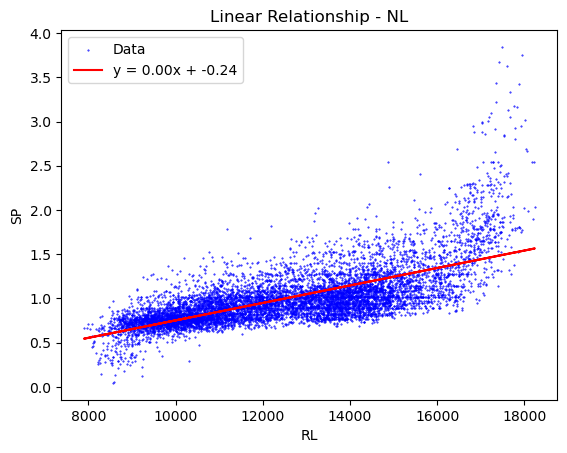

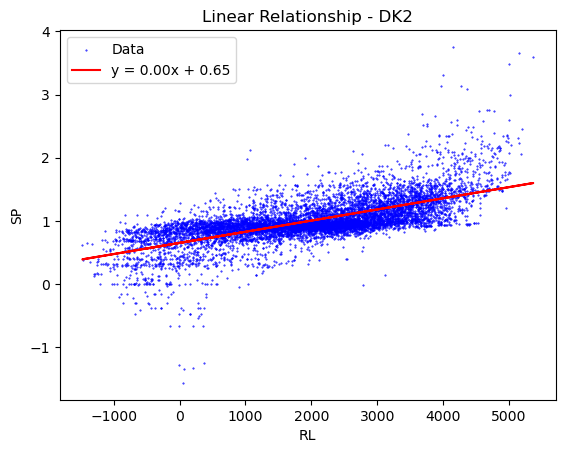

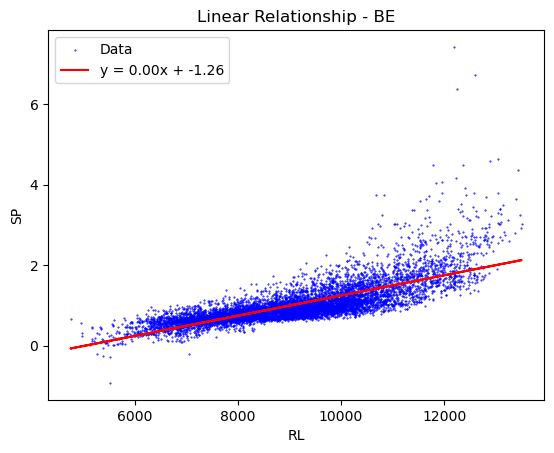

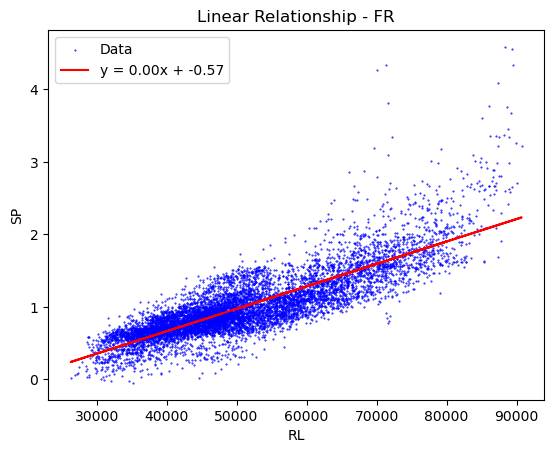

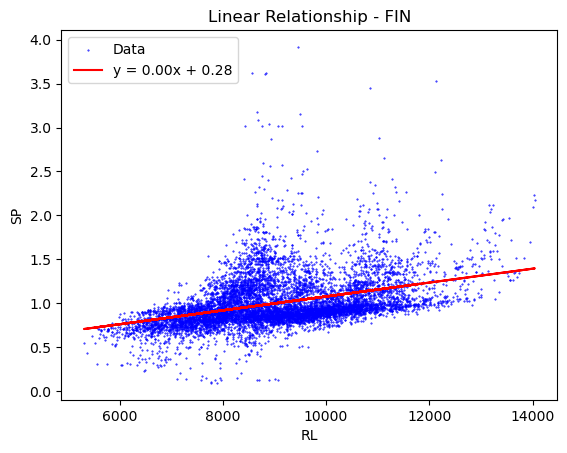

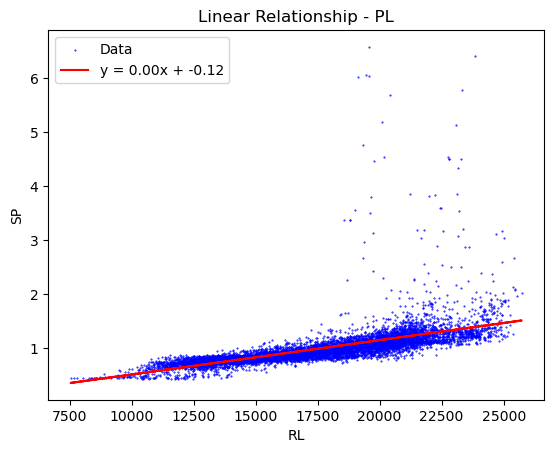

Country: NL
Slope (m): 9.870492532762218e-05
Intercept (n): -0.2356271659496498
Correlation: 0.7001611324961544

Country: DK2
Slope (m): 0.00017663211142972666
Intercept (n): 0.6512695806617341
Correlation: 0.6778049055917902

Country: BE
Slope (m): 0.00025097325203430617
Intercept (n): -1.264452298572044
Correlation: 0.7739434517911126

Country: FR
Slope (m): 3.093137098549606e-05
Intercept (n): -0.5726780573654918
Correlation: nan

Country: FIN
Slope (m): 7.912123288849303e-05
Intercept (n): 0.2837875714613943
Correlation: nan

Country: PL
Slope (m): 6.346200574836378e-05
Intercept (n): -0.1157928827283905
Correlation: nan



In [7]:
# RES LOAD
data= {
    'NL': (RL_NL, SP_NL),
    'DK2': (RL_DK2, SP_DK2),
    'BE': (RL_BE, SP_BE),
    'FR': (RL_FR, SP_FR),
    # 'DE': (D_DE, SP_DE),
    'FIN': (RL_FIN, SP_FIN),
    'PL': (RL_PL, SP_PL),
}

slopes = {}
intercepts = {}
correlations = {}

for country, (RL, SP) in data.items():

    nan_mask = np.isnan(RL) | np.isnan(SP)

    RL_no_nan = RL[~nan_mask]
    SP_no_nan = SP[~nan_mask]

    m, n = np.polyfit(RL_no_nan, SP_no_nan, 1)

    correlation = np.corrcoef(RL, SP)[0, 1]

    slopes[f"m_{country}_{i_st_y}_{i_end_y}"] = m
    intercepts[f"n_{country}_{i_st_y}_{i_end_y}"] = n
    correlations[f"corr_{country}_{i_st_y}_{i_end_y}"] = correlation

    line = f'y = {m:.2f}x + {n:.2f}'

    plt.scatter(RL, SP, color='blue', label='Data', s=0.2)
    plt.plot(RL, m * RL + n, color='red', label=line)
    plt.xlabel('RL')
    # plt.xlabel('D')
    plt.ylabel('SP')
    plt.title(f'Linear Relationship - {country}')
    plt.legend()
    plt.show()

slopes_df = pd.DataFrame.from_dict(slopes, orient='index', columns=['Slope'])
intercepts_df = pd.DataFrame.from_dict(intercepts, orient='index', columns=['Intercept'])
correlations_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['Correlation'])

# Print the slopes, intercepts, and correlations for all countries
for country in data:
    print(f'Country: {country}')
    print('Slope (m):', slopes[f"m_{country}_{i_st_y}_{i_end_y}"])
    print('Intercept (n):', intercepts[f"n_{country}_{i_st_y}_{i_end_y}"])
    print('Correlation:', correlations[f"corr_{country}_{i_st_y}_{i_end_y}"])
    print()

In [8]:
# # m
# # choose the country:

# data = {
#     'NL': (D_NL, SP_NL),
#     'DK2': (D_DK2, SP_DK2),
#     'BE': (D_BE, SP_BE), 
#     'FR': (D_FR, SP_FR), 
#     'DE': (D_DE, SP_DE), 
#     'FIN': (D_FIN, SP_FIN),
#     'PL': (D_PL, SP_PL),
# }

# D=D_NL
# SP= SP_NL

# m, n = np.polyfit(D, SP, 1)

# correlation = np.corrcoef(D, SP)[0, 1]

# line = f'y = {m:.2f}x + {n:.2f}'

# plt.scatter(D, SP, color='blue', label='Data', s=0.2)
# plt.plot(D, m * D + n, color='red', label=line)
# plt.xlabel('D')
# plt.ylabel('SP')
# plt.title('Linear Relationship')
# plt.legend()
# plt.show()

# # Print the slope, intercept, and correlation
# print('Slope (m):', m)
# print('Intercept (n):', n)
# print('Correlation:', correlation)

# # from the outputs i save manually the important data:
# m_NL_0_1= 1.2935035360358111
# n_NL_0_1= -0.2935035360358126
# corr_NL_0_1= 0.653590029247126

# m_NL_0_3= 1.1463422921638236
# n_NL_0_3= -0.1463422921638323
# corr_NL_0_3= 0.523833277435362

# m_NL_0_6= 1.0825311021279556
# n_NL_0_6= -0.08253110212793172
# corr_NL_0_6= 0.21878424343191746

# # the longer the df the lower the correlation. But, what it we analyse year by year, does the slope also decrease? 
# # (is the spot price less dependent on the load in 2021 or in 2015?)
# m_NL_4_5= 2.0480577905115394
# m_NL_4_5= -1.0480577905115482
# corr_NL_4_5= 0.6647655345656723


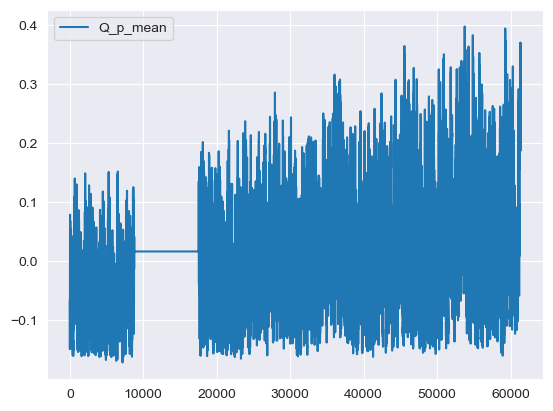

Indices with NaN values: []
Number of NaN values before index 8760: 0


In [109]:
# easy: but they are not filtered by year
import statsmodels.api as sm
VRE_DE = df_DE_solar + df_DE_wind_offshore + df_DE_wind_onshore
VRE_DK2 = df_DK2_solar + df_DK2_wind_offshore + df_DK2_wind_onshore
VRE_FR = df_FR_solar + df_FR_wind_onshore
VRE_NL = df_NL_solar + df_NL_wind_offshore + df_NL_wind_onshore
VRE_FIN = df_FIN_wind_onshore
VRE_PL = df_PL_solar + df_PL_wind_onshore
VRE_BE= df_BE_solar +df_BE_wind_offshore+df_BE_wind_onshore

Q_BE= (VRE_BE/avg_D_BE).astype(float)
Q_DE= VRE_DE/avg_D_DE
Q_DK2= VRE_DK2/avg_D_DK2
Q_FR= VRE_FR/avg_D_FR
Q_NL= VRE_NL/avg_D_NL
Q_FIN= VRE_FIN/avg_D_FIN
Q_PL= VRE_NL/avg_D_PL

Q_p_BE = (Q_BE - Q_BE.mean()).iloc[0:61368]
Q_p_DE = (Q_DE - Q_DE.mean()).iloc[0:61368]
Q_p_DK2 = (Q_DK2 - Q_DK2.mean()).iloc[0:61368]
Q_p_FR = (Q_FR - Q_FR.mean()).iloc[0:61368]
Q_p_NL = (Q_NL - Q_NL.mean()).iloc[0:61368]
Q_p_FIN = (Q_FIN - Q_FIN.mean()).iloc[0:61368]
Q_p_PL = (Q_PL - Q_PL.mean()).iloc[0:61368]

# Q_p_mean = np.mean([Q_p_BE.values, Q_p_DK2.values, Q_p_FR.values, Q_p_NL.values, Q_p_PL.values], axis=0)
Q_p_mean = np.mean([Q_p_BE.values, Q_p_DE.values, Q_p_DK2.values, Q_p_FR.values, Q_p_FIN.values, Q_p_NL.values, Q_p_PL.values], axis=0)
Q_p_mean_series = pd.Series(Q_p_mean)
# Fill NaN values with the previous non-NaN value
Q_p_mean_filled = Q_p_mean_series.fillna(method='ffill')
# Convert Q_p_mean_filled back to a numpy array
Q_p_mean = Q_p_mean_filled.values

beg_year=0
end_year=8760
# plt.plot(Q_p_BE.iloc[beg_year:end_year], label='Q_p_BE')
# # plt.plot(Q_p_DE.iloc[beg_year:end_year], label='Q_p_DE')
# plt.plot(Q_p_DK2.iloc[beg_year:end_year], label='Q_p_DK2')
# plt.plot(Q_p_FR.iloc[beg_year:end_year], label='Q_p_FR')
# plt.plot(Q_p_NL.iloc[beg_year:end_year], label='Q_p_NL')
# plt.plot(Q_p_FIN.iloc[beg_year:end_year], label='Q_p_FIN')
# plt.plot(Q_p_PL.iloc[beg_year:end_year], label='Q_p_PL')

# plt.legend()
# plt.show()

# Fit linear trend using OLS for each Q_p_XX variable
trend_BE = sm.OLS(Q_p_BE.iloc[beg_year:end_year], sm.add_constant(np.arange(beg_year, end_year))).fit().fittedvalues
trend_DE = sm.OLS(Q_p_DE.iloc[beg_year:end_year], sm.add_constant(np.arange(beg_year, end_year))).fit().fittedvalues
trend_DK2 = sm.OLS(Q_p_DK2.iloc[beg_year:end_year], sm.add_constant(np.arange(beg_year, end_year))).fit().fittedvalues
trend_FR = sm.OLS(Q_p_FR.iloc[beg_year:end_year], sm.add_constant(np.arange(beg_year, end_year))).fit().fittedvalues
trend_NL = sm.OLS(Q_p_NL.iloc[beg_year:end_year], sm.add_constant(np.arange(beg_year, end_year))).fit().fittedvalues
trend_FIN = sm.OLS(Q_p_FIN.iloc[beg_year:end_year], sm.add_constant(np.arange(beg_year, end_year))).fit().fittedvalues
trend_PL = sm.OLS(Q_p_PL.iloc[beg_year:end_year], sm.add_constant(np.arange(beg_year, end_year))).fit().fittedvalues

# Plot the linear trend lines
# plt.ylim(-0.25, 0.25)
# plt.plot(trend_BE, label='Q_p_BE Trend')
# # plt.plot(trend_DE, label='Q_p_DE Trend')
# plt.plot(trend_DK2, label='Q_p_DK2 Trend')
# plt.plot(trend_FR, label='Q_p_FR Trend')
# plt.plot(trend_NL, label='Q_p_NL Trend')
# plt.plot(trend_FIN, label='Q_p_FIN Trend')
# plt.plot(trend_PL, label='Q_p_PL Trend')
plt.plot(Q_p_mean, label='Q_p_mean')
plt.legend()
plt.show()

nan_indices = np.isnan(Q_p_mean)
nan_count_before_8760 = np.sum(nan_indices[:8760])
# Print the indices where NaN values are present
print("Indices with NaN values:", np.where(nan_indices)[0])
print("Number of NaN values before index 8760:", nan_count_before_8760)

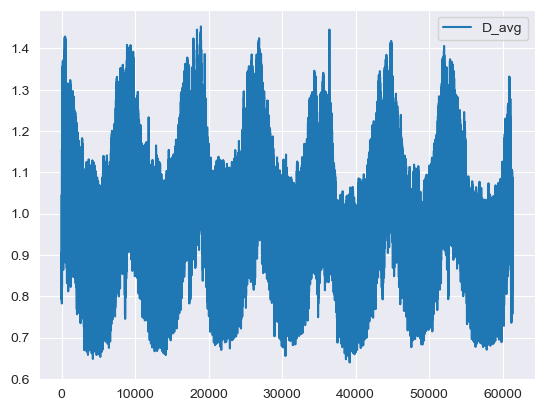

In [110]:
#  now for demand:
# plt.plot(D_NL, label='D_NL')
# plt.plot(D_BE, label='D_BE')
# plt.plot(D_FR, label='D_FR')
# plt.plot(D_FIN, label='D_FIN')
# plt.plot(D_PL, label='D_PL')
# plt.plot(D_DK2, label='D_DK2')
# plt.plot(D_DE)
D_avg= np.mean([D_NL.values,D_BE.values, D_FR.values, D_FIN.values, D_DE.values, D_DK2.values, D_PL.values],axis=0)
plt.plot(D_avg, label='D_avg')
plt.legend()
plt.show()



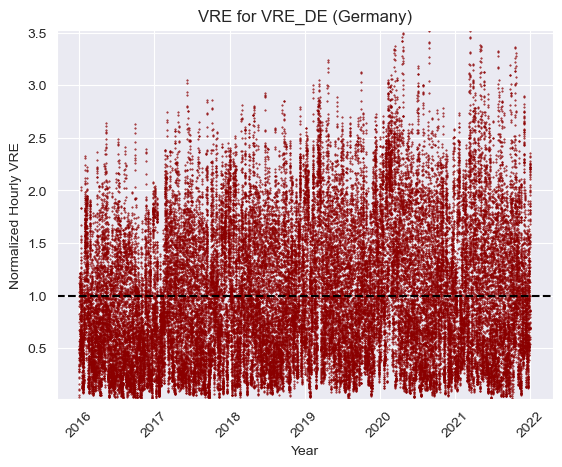

Number of values below average VRE generation: 29376
max_dif: 2.5269315064887374
min_dif: 0.9850795825130703


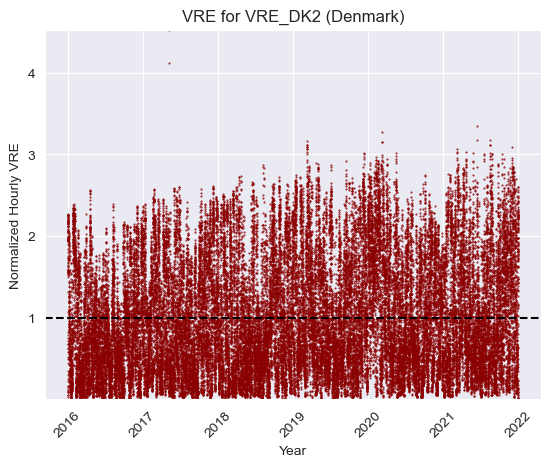

Number of values below average VRE generation: 29663
max_dif: 3.5245090908240595
min_dif: 0.9950044064360942


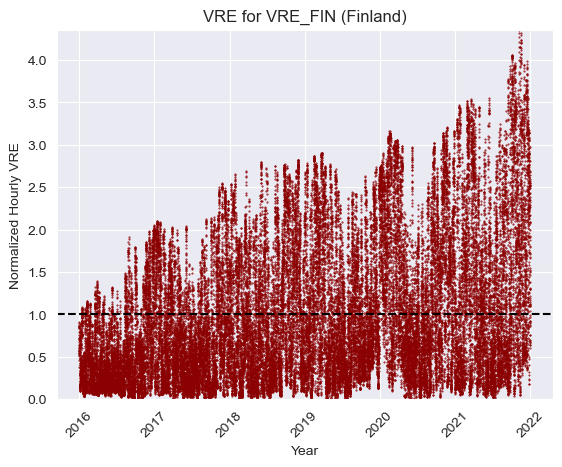

Number of values below average VRE generation: 31636
max_dif: 3.3567866690262083
min_dif: 1.0000000000000056


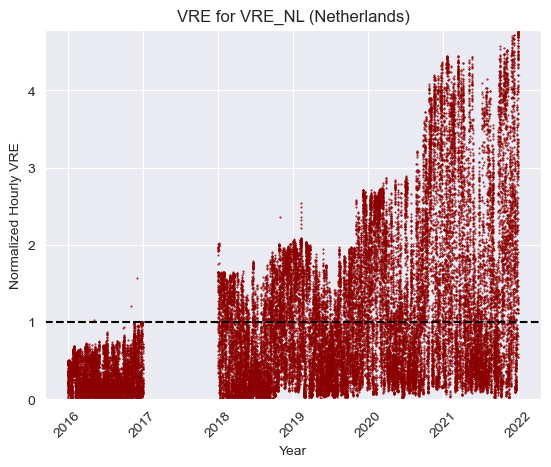

Number of values below average VRE generation: 27564
max_dif: 3.785861777493319
min_dif: 1.0000000000000033


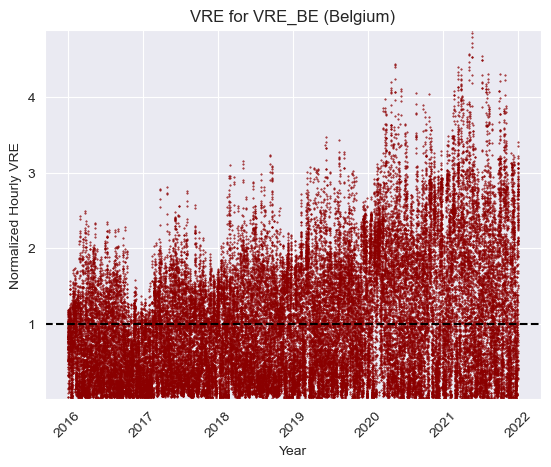

Number of values below average VRE generation: 29977
max_dif: 3.8907714396437436
min_dif: 0.9983719652501011


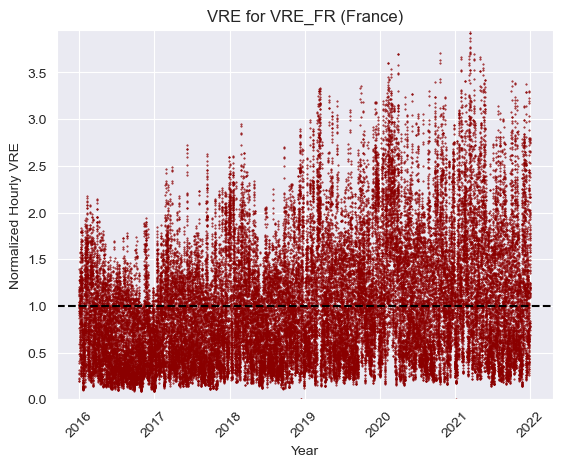

Number of values below average VRE generation: 30486
max_dif: 2.9580875857915228
min_dif: 0.9999999999999984


In [102]:
# vre_automatization too:
start_year_indexes = [0, 8785, 17545, 26305, 35065, 43849, 52608]
year_labels = [2016, 2017, 2018, 2019, 2020, 2021, 2022]

def calculate_demand(load_df, start_index, end_index):
    load_data = load_df.astype(float).iloc[start_index:end_index]
    avg_load = load_data.mean()
    demand = load_data / avg_load
    return demand, avg_load


# Plotting Demands: 
def plot_demands(dfL, dfL_name, avg_load, start_indexes, year_labels):
    x = range(len(dfL))
    y = dfL.values.flatten()
    if len(y) == 0:
        print(f"No data available for {dfL_name}")
        return
    avg_load=dfL.mean()
    plt.scatter(x, y, marker='o', s=0.2, color='darkred')
    plt.axhline(y=avg_load, color='black', linestyle='--')
    plt.xticks(start_indexes, year_labels, rotation=45)
    plt.xlabel('Year')
    plt.ylabel('Normalized Hourly VRE')
    plt.title(f'VRE for {dfL_name}')
    plt.ylim(min(y), max(y))
    plt.show()
       # Count the number of values below average load
    num_below_avg = len(dfL[dfL < avg_load])
    print(f"Number of values below average VRE generation: {num_below_avg}")
    max_value = dfL.max()
    min_value = dfL.min()
    max_dif = max_value - avg_load
    min_dif = avg_load - min_value
    print(f"max_dif: {max_dif}")
    print(f"min_dif: {min_dif}")
# --------------------------------------------------------------------------------------------------------------------------
# select start and end year: choose index
i_st_y=0
i_end_y=7
# --------------------------------------------------------------------------------------------------------------------------
# Germany
df_DE_VRE = VRE_DE.astype(float)
VRE_DE, avg_VRE_DE = calculate_demand(df_DE_VRE, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_demands(VRE_DE, 'VRE_DE (Germany)', avg_VRE_DE, start_year_indexes[i_st_y:i_end_y+1], year_labels[i_st_y:i_end_y+1])

# Denmark
df_DK2_VRE = VRE_DK2.astype(float)
VRE_DK2, avg_VRE_DK2 = calculate_demand(df_DK2_VRE, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_demands(VRE_DK2, 'VRE_DK2 (Denmark)', avg_VRE_DK2, start_year_indexes[i_st_y:i_end_y+1], year_labels[i_st_y:i_end_y+1])

# Poland
# df_PL_VRE = VRE_PL.astype(float)
# VRE_PL, avg_VRE_PL = calculate_demand(df_PL_VRE, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
# plot_demands(VRE_PL, 'VRE_PL (Poland)', avg_VRE_PL, start_year_indexes[i_st_y:i_end_y], year_labels[i_st_y:i_end_y])

# Finland
df_FIN_VRE = VRE_FIN.astype(float)
VRE_FIN, avg_VRE_FIN = calculate_demand(df_FIN_VRE, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_demands(VRE_FIN, 'VRE_FIN (Finland)', avg_VRE_FIN, start_year_indexes[i_st_y:i_end_y+1], year_labels[i_st_y:i_end_y+1])

# Netherlands
df_NL_VRE = VRE_NL.astype(float)
VRE_NL, avg_VRE_NL = calculate_demand(df_NL_VRE, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_demands(VRE_NL, 'VRE_NL (Netherlands)', avg_VRE_NL, start_year_indexes[i_st_y:i_end_y+1], year_labels[i_st_y:i_end_y+1])

# Belgium
df_BE_VRE = VRE_BE.astype(float)
VRE_BE, avg_VRE_BE = calculate_demand(df_BE_VRE, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_demands(VRE_BE, 'VRE_BE (Belgium)', avg_VRE_BE, start_year_indexes[i_st_y:i_end_y+1], year_labels[i_st_y:i_end_y+1])

# France
df_FR_VRE = VRE_FR.astype(float)
VRE_FR, avg_VRE_FR = calculate_demand(df_FR_VRE, start_year_indexes[i_st_y], start_year_indexes[i_end_y])
plot_demands(VRE_FR, 'VRE_FR (France)', avg_VRE_FR, start_year_indexes[i_st_y:i_end_y+1], year_labels[i_st_y:i_end_y+1])

In [11]:
# correlation btw VRE and SP: problem, different sizes
data= {
    'NL': (VRE_NL, SP_NL),
    'DK2': (VRE_DK2, SP_DK2),
    'BE': (VRE_BE, SP_BE),
    'FR': (VRE_FR, SP_FR),
    'DE': (VRE_DE, SP_DE),
    'FIN': (VRE_FIN, SP_FIN),
    # 'PL': (VRE_PL, SP_PL),
}

slopes = {}
intercepts = {}
correlations = {}

for country, (RL, SP) in data.items():

    nan_mask = np.isnan(RL) | np.isnan(SP)

    RL_no_nan = RL[~nan_mask]
    SP_no_nan = SP[~nan_mask]

    m, n = np.polyfit(RL_no_nan, SP_no_nan, 1)

    correlation = np.corrcoef(RL, SP)[0, 1]

    slopes[f"m_{country}_{i_st_y}_{i_end_y}"] = m
    intercepts[f"n_{country}_{i_st_y}_{i_end_y}"] = n
    correlations[f"corr_{country}_{i_st_y}_{i_end_y}"] = correlation

    line = f'y = {m:.2f}x + {n:.2f}'

    plt.scatter(RL, SP, color='blue', label='Data', s=0.2)
    plt.plot(RL, m * RL + n, color='red', label=line)
    plt.xlabel('RL')
    # plt.xlabel('D')
    plt.ylabel('SP')
    plt.title(f'Linear Relationship - {country}')
    plt.legend()
    plt.show()

slopes_df = pd.DataFrame.from_dict(slopes, orient='index', columns=['Slope'])
intercepts_df = pd.DataFrame.from_dict(intercepts, orient='index', columns=['Intercept'])
correlations_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['Correlation'])

# Print the slopes, intercepts, and correlations for all countries
for country in data:
    print(f'Country: {country}')
    print('Slope (m):', slopes[f"m_{country}_{i_st_y}_{i_end_y}"])
    print('Intercept (n):', intercepts[f"n_{country}_{i_st_y}_{i_end_y}"])
    print('Correlation:', correlations[f"corr_{country}_{i_st_y}_{i_end_y}"])
    print()


# for country, (VRE, SP) in data.items():
#     VRE_no_nan = VRE.dropna()
#     SP_no_nan = SP.dropna()

#     common_index = VRE_no_nan.index.intersection(SP_no_nan.index)
#     VRE_no_nan = VRE_no_nan.loc[common_index]
#     SP_no_nan = SP_no_nan.loc[common_index]

#     m, n = np.polyfit(VRE_no_nan, SP_no_nan, 1)

#     correlation = np.corrcoef(VRE_no_nan, SP_no_nan)[0, 1]

#     slopes[f"m_{country}_{i_st_y}_{i_end_y}"] = m
#     intercepts[f"n_{country}_{i_st_y}_{i_end_y}"] = n
#     correlations[f"corr_{country}_{i_st_y}_{i_end_y}"] = correlation

#     line = f'y = {m:.2f}x + {n:.2f}'

#     plt.scatter(VRE, SP, color='green', label='Data', s=0.2)
#     plt.plot(VRE, m * VRE + n, color='red', label=line)
#     plt.xlabel('VRE')
#     plt.ylabel('SP')
#     plt.title(f'Linear Relationship - {country}')
#     plt.legend()
#     plt.show()

# slopes_df = pd.DataFrame.from_dict(slopes, orient='index', columns=['Slope'])
# intercepts_df = pd.DataFrame.from_dict(intercepts, orient='index', columns=['Intercept'])
# correlations_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['Correlation'])

# # Print the slopes, intercepts, and correlations for all countries
# for country in data:
#     print(f'Country: {country}')
#     print('Slope (m):', slopes[f"m_{country}_{i_st_y}_{i_end_y}"])
#     print('Intercept (n):', intercepts[f"n_{country}_{i_st_y}_{i_end_y}"])
#     print('Correlation:', correlations[f"corr_{country}_{i_st_y}_{i_end_y}"])
#     print()




C:\Users\ngt13\AppData\Local\Temp\ipykernel_2524\1539368824.py:20: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  RL_no_nan = RL[~nan_mask]


ValueError: cannot reindex on an axis with duplicate labels

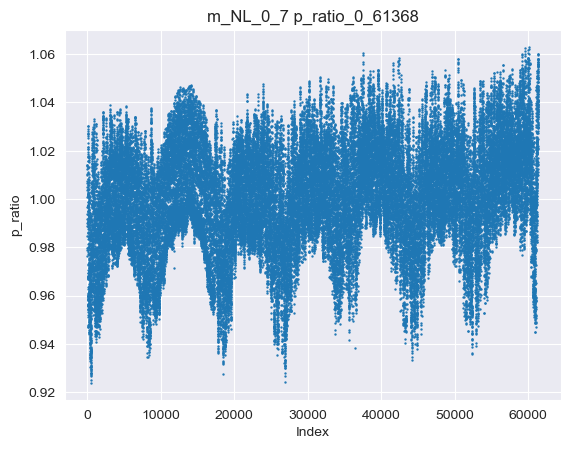

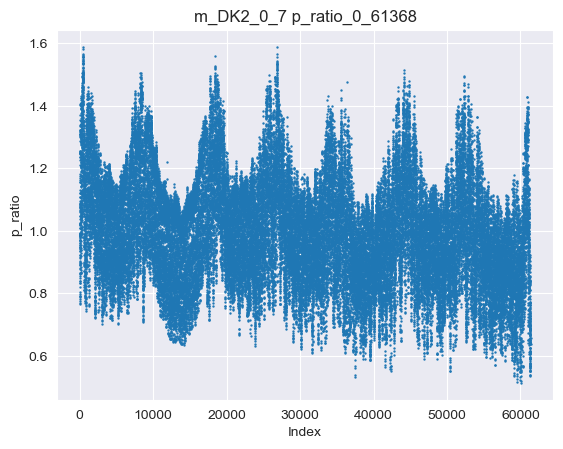

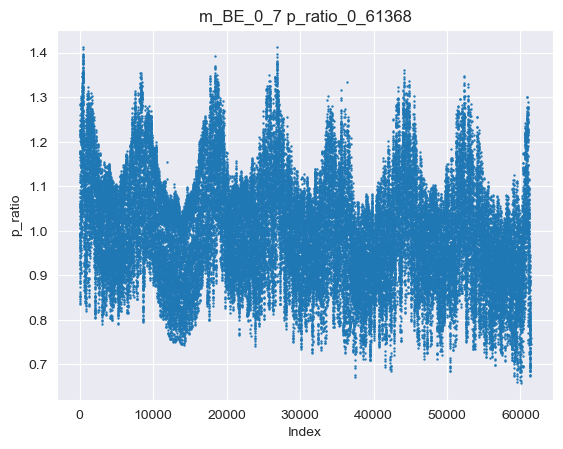

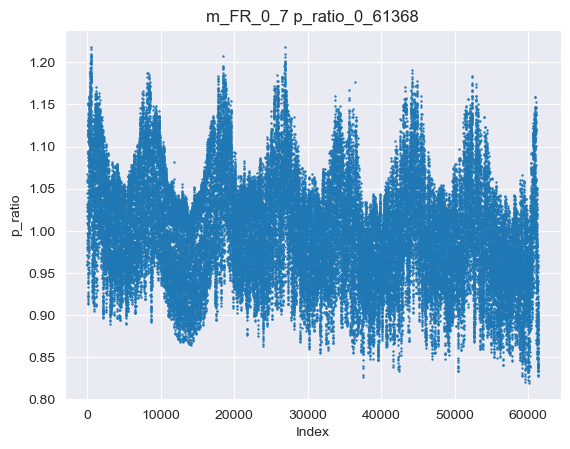

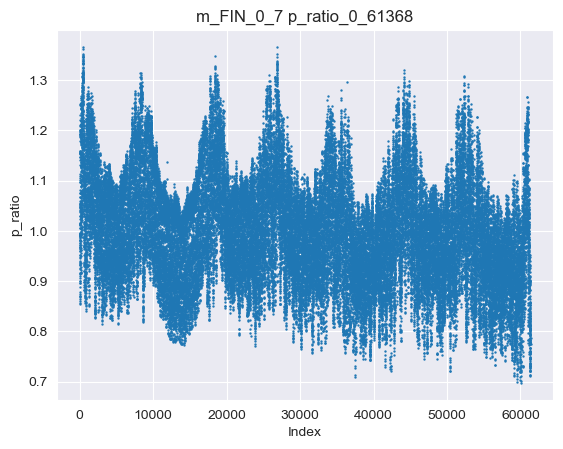

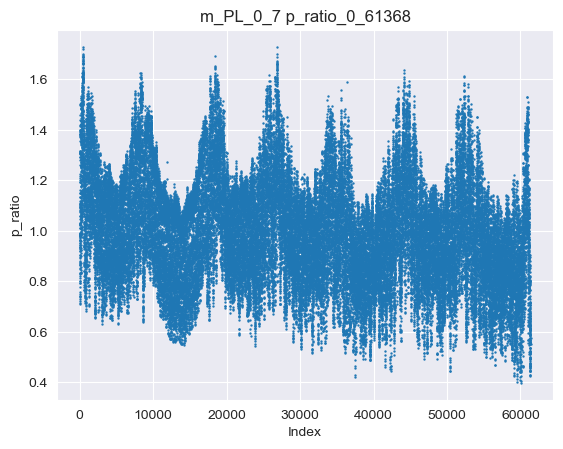

m_NL_0_7 p_ratio_0_61368:
[1.00371935 1.00683483 1.01011507 ... 1.04334901 1.04456828 1.04682451]

m_DK2_0_7 p_ratio_0_61368:
[0.97127744 0.94721828 0.92188668 ... 0.66523867 0.65582286 0.63839926]

m_BE_0_7 p_ratio_0_61368:
[0.97983735 0.96294831 0.94516604 ... 0.76500435 0.75839465 0.74616363]

m_FR_0_7 p_ratio_0_61368:
[0.98933517 0.98040189 0.97099615 ... 0.8757015  0.87220537 0.8657359 ]

m_FIN_0_7 p_ratio_0_61368:
[0.98214549 0.96718984 0.95144322 ... 0.79190576 0.78605271 0.77522185]

m_PL_0_7 p_ratio_0_61368:
[0.96444855 0.93466925 0.90331497 ... 0.585648   0.57399355 0.55242742]



In [111]:
# start_year_indexes = [0, 8785, 17545, 26305, 35065, 43849, 52608, 61368]
# year_labels = [2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023] 
i_st_y = 0
i_end_y = 61368

m_slope = slopes_df['Slope']
p_ratios = {}

data = {
    'NL': (D_NL, SP_NL),
    'DK2': (D_DK2, SP_DK2),
    'BE': (D_BE, SP_BE),
    'FR': (D_FR, SP_FR),
    # 'DE': (D_DE, SP_DE),
    'FIN': (D_FIN, SP_FIN),
    'PL': (D_PL, SP_PL),
}

# CHOOSE THE COUNTRY
D= D_avg
Q_p= Q_p_mean

for country in slopes_df.index:
    # p_ratio = m_slope[country] * D + (1 - m_slope[country]) - m_slope[country] * Q_p.iloc[i_st_y:i_end_y]
    p_ratio = m_slope[country] * D + (1 - m_slope[country]) - m_slope[country] * Q_p
    p_ratios[country] = p_ratio
    
    # Scatter plot
    plt.figure()
    plt.scatter(range(len(p_ratio)), p_ratio, s=0.5)
    plt.xlabel('Index')
    plt.ylabel('p_ratio')
    plt.title(f'{country} p_ratio_{i_st_y}_{i_end_y}')
    
plt.show()

# Access the p_ratio values for each country
for country, p_ratio in p_ratios.items():
    print(f'{country} p_ratio_{i_st_y}_{i_end_y}:')
    print(p_ratio)
    print()


C:\Users\ngt13\AppData\Local\Temp\ipykernel_15192\1418480102.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


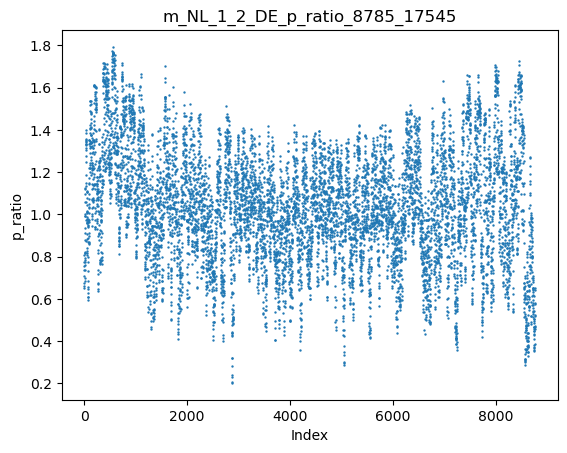

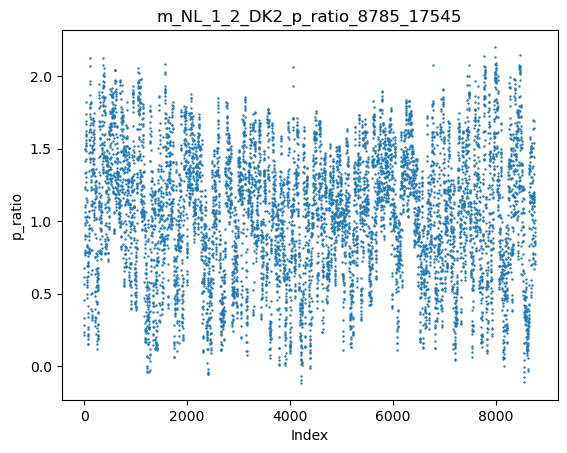

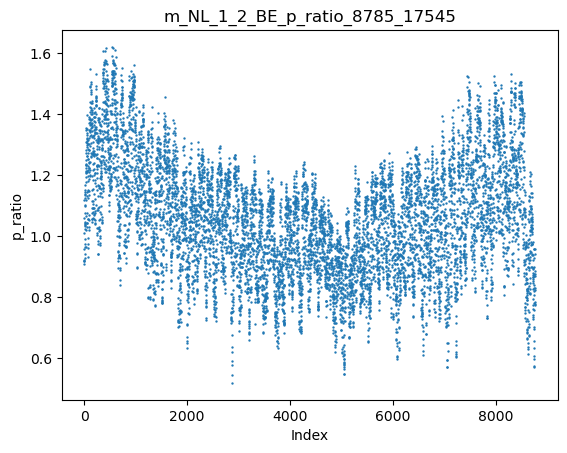

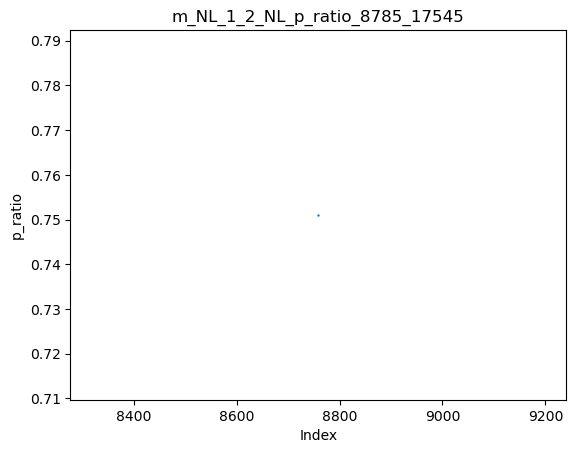

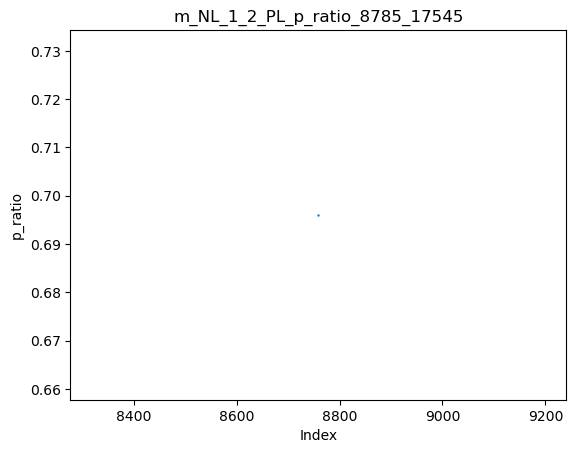

...

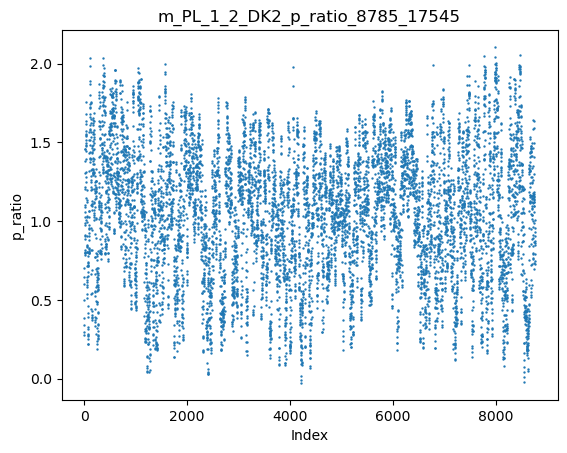

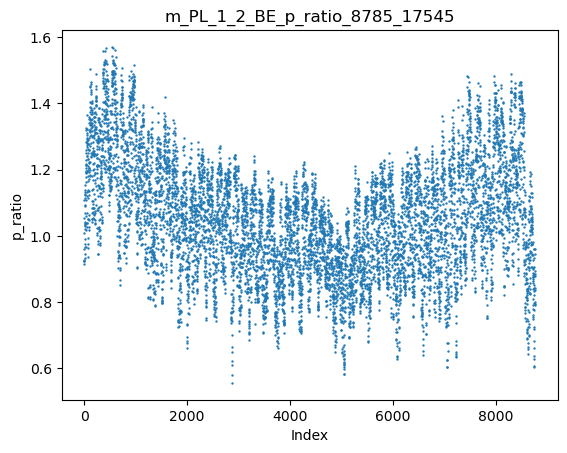

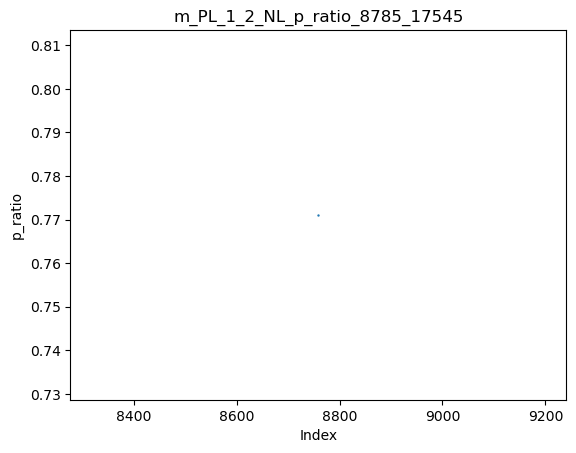

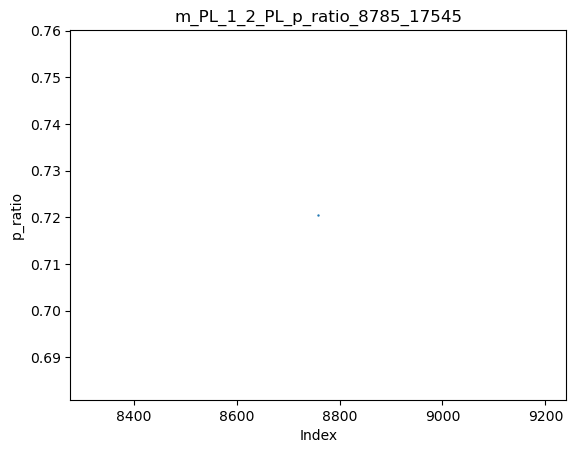

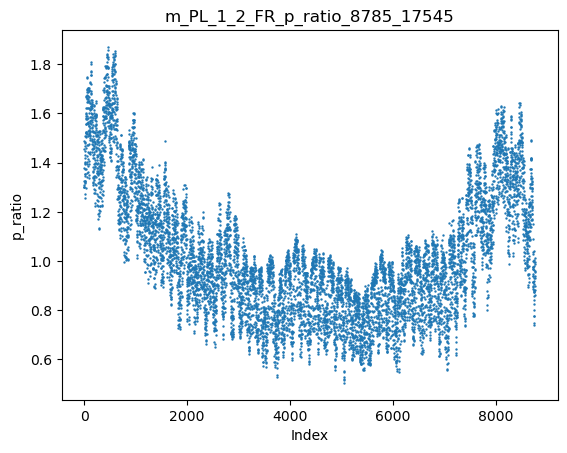

m_NL_1_2_DE p_ratio_8785_17545:
5        0.807336
9        0.774515
13       0.753940
17       0.738434
21       0.708780
           ...   
35025    0.578908
35029    0.524920
35033    0.518503
35037    0.473192
1        0.467455
Length: 8760, dtype: float64

m_NL_1_2_DK2 p_ratio_8785_17545:
2       0.212262
3       0.234089
4       0.282422
5       0.334415
6       0.453484
          ...   
8757    0.897527
8758    0.866209
8759    0.832620
8760    0.776865
1       0.702163
Length: 8760, dtype: float64

m_NL_1_2_BE p_ratio_8785_17545:
2       1.117705
3       1.060072
4       1.009732
5       0.955437
6       0.921638
          ...   
8757    0.828354
8758    0.782159
8759    0.775168
8760    0.820859
1       0.773505
Length: 8760, dtype: float64

m_NL_1_2_NL p_ratio_8785_17545:
2           NaN
3           NaN
4           NaN
5           NaN
6           NaN
         ...   
8757        NaN
8758        NaN
8759        NaN
8760        NaN
1       0.75103
Length: 8760, dtype: float64

m_N

In [ ]:
# too complicated and the results wont vary much
# i_st_y = 8785
# i_end_y = 17545
# country_init = ['DE', 'DK2', 'BE', 'NL', 'PL', 'FR']
# m_slope = slopes_df['Slope']
# p_ratios = {}

# for country in slopes_df.index:
#     for country_code in country_init:
#         p_ratio = m_slope[country] * globals()['D_' + country_code] + (1 - m_slope[country]) - m_slope[country] * globals()['Q_p_' + country_code].iloc[i_st_y:i_end_y]
#         p_ratios[country + '_' + country_code] = p_ratio
    
#         # Scatter plot
#         plt.figure()
#         plt.scatter(range(len(p_ratio)), p_ratio, s=0.5)
#         plt.xlabel('Index')
#         plt.ylabel('p_ratio')
#         plt.title(f'{country}_{country_code}_p_ratio_{i_st_y}_{i_end_y}')
    
# plt.show()

# # Access the p_ratio values for each country and initial country
# for key, p_ratio in p_ratios.items():
#     print(f'{key} p_ratio_{i_st_y}_{i_end_y}:')
#     print(p_ratio)
#     print()

In [112]:
# export p_values to excel
df_rat = pd.DataFrame(p_ratios)

# Save the DataFrame to an Excel file
df_rat.to_excel('p_ratios_0_7.xlsx', index=False)

In [ ]:
# checkear
df1 = pd.read_excel('p_ratios_2_3.xlsx')
df2 = pd.read_excel('p_ratios_1_2.xlsx')
if df1.equals(df2):
    print("The files are identical.")
else:
    print("The files are different.")
if df1.isnull().values.any() or df2.isnull().values.any():
    print("At least one of the files contains NaN values.")

    if df1.isnull().values.any():
        print("NaN values found in p_ratios_0_1.xlsx:")
        nan_locations = np.argwhere(df1.isnull())
        for location in nan_locations:
            print("Row:", location[0], "Column:", location[1])

    if df2.isnull().values.any():
        print("NaN values found in p_ratios_1_2.xlsx:")
        nan_locations = np.argwhere(df2.isnull())
        for location in nan_locations:
            print("Row:", location[0], "Column:", location[1])
else:
    print("Both files do not contain any NaN values.")    


The files are different.
At least one of the files contains NaN values.
NaN values found in p_ratios_1_2.xlsx:


ValueError: Shape of passed values is (2, 61313), indices imply (8760, 7)